In [2]:
import grizli
from grizli import utils
from grizli.prep import process_direct_grism_visit
from grizli.pipeline import auto_script
from grizli.multifit import GroupFLT, MultiBeam, get_redshift_fit_defaults
from grizli.pipeline import photoz
import os
import glob
from glob import glob

In [18]:
class Pointing():
    def __init__(self, field, ref_filter):
        if 'N' in field.upper():
            self.pad = 200
            self.seg_map =  PATH_TO_CATS + '/Goods_N_plus_unmatched_seg.fits'
            self.catalog = PATH_TO_CATS + '/goodsn-v4.4-withunmatched.cat'
            self.ref_image =  PATH_TO_CATS + '/goodsn-F105W-astrodrizzle-v4.4_drz_sci.fits'

            self.params = {}
            #self.params['CATALOG_FILE'] = PATH_TO_CATS + '/{0}_3dhst.{1}.cats/Catalog/{0}_3dhst.{1}.cat'.format('goodsn', 'v4.3')
            self.params['CATALOG_FILE'] = PATH_TO_CATS + '/{0}_3dhst.{1}.cats/Catalog/{0}_3dhst.{1}.cat'.format('goodsn', 'v4.4', 'goodsn', 'v4.4')

            self.params['Z_STEP'] = 0.002
            self.params['Z_MAX'] = 4

            self.params['MAIN_OUTPUT_FILE'] = '{0}_3dhst.{1}.eazypy'.format('goodsn', 'v4.4')
            self.params['PRIOR_FILTER'] = 205


            self.params['MW_EBV'] = {'aegis':0.0066, 'cosmos':0.0148, 'goodss':0.0069, 
                                    'uds':0.0195, 'goodsn':0.0103}['goodsn']

            self.params['TEMPLATES_FILE'] = 'templates/fsps_full/tweak_fsps_QSF_12_v3.param'
            #self.translate_file = PATH_TO_CATS + '/{0}_3dhst.{1}.cats/Eazy/{0}_3dhst.{1}.translate'.format('goodsn', 'v4.3')
            self.translate_file = PATH_TO_CATS + '/{0}_{1}.translate'.format('goodsn', 'v4.4')

        elif 'S' in field.upper():
            self.pad = 200
            self.seg_map =  PATH_TO_CATS + '/Goods_S_plus_unmatched_seg.fits'
            self.catalog = PATH_TO_CATS + '/goodss-v4.4-withunmatched.cat'
            self.ref_image =  PATH_TO_CATS + '/goodss-F105W-astrodrizzle-v4.3_drz_sci.fits' 
            self.params = {}
            self.params['CATALOG_FILE'] = PATH_TO_CATS + '/{0}_3dhst.{1}.cats/Catalog/{0}_3dhst.{1}.cat'.format('goodss', 'v4.4', 'goodss', 'v4.4')
            self.params['Z_STEP'] = 0.002
            self.params['Z_MAX'] = 4

            self.params['MAIN_OUTPUT_FILE'] = '{0}_3dhst.{1}.eazypy'.format('goodss', 'v4.4')
            self.params['PRIOR_FILTER'] = 205


            self.params['MW_EBV'] = {'aegis':0.0066, 'cosmos':0.0148, 'goodss':0.0069, 
                                    'uds':0.0195, 'goodsn':0.0103}['goodsn']

            self.params['TEMPLATES_FILE'] = 'templates/fsps_full/tweak_fsps_QSF_12_v3.param'
            #self.translate_file = PATH_TO_CATS + '/{0}_3dhst.{1}.cats/Eazy/{0}_3dhst.{1}.translate'.format('goodss', 'v4.3')
            self.translate_file = PATH_TO_CATS + '/{0}_{1}.translate'.format('goodss', 'v4.4')


            
            
            

In [8]:
field = 'GS5'
HOME_PATH = '/Volumes/pegasus/clear/grizli_extractions/%s'%field
PATH_TO_RAW         = glob(HOME_PATH + '/*/RAW')[0]
PATH_TO_PREP        = glob(HOME_PATH + '/*/Prep_z67')[0]
PATH_TO_CATS = '/Volumes/pegasus/clear/grizli_extractions/Catalogs'
if 'S' in field:
    dis_matched = ascii.read(PATH_TO_CATS + '/z67_in_CLEAR_GS_matched_Finkelstein.txt')
    dis_unmatched = ascii.read(PATH_TO_CATS + '/z67_in_CLEAR_GS_unmatched_Finkelstein.txt')

else:
    dis_matched = ascii.read(PATH_TO_CATS + '/z67_in_CLEAR_GN_matched_Finkelstein.txt')
    dis_unmatched = ascii.read(PATH_TO_CATS + '/z67_in_CLEAR_GN_unmatched_Finkelstein.txt')

os.chdir(PATH_TO_PREP)

In [9]:
os.chdir(PATH_TO_PREP)
files = glob('%s/*flt.fits'%PATH_TO_RAW)
info = grizli.utils.get_flt_info(files)
visits, filters = grizli.utils.parse_flt_files(info=info, uniquename=True)


goodss-30-bhj-30-230.0-F140W 4
goodss-30-bhj-30-230.0-G141 4
goodss-35-bhj-35-131.0-F140W 4
goodss-35-bhj-35-131.0-G141 4
GS5-cxt-15-173.0-F105W 2
GS5-cxt-16-173.0-F105W 2
GS5-cxt-13-194.0-F105W 2
GS5-cxt-14-194.0-F105W 2
GS5-cxt-17-216.0-F105W 2
GS5-cxt-18-216.0-F105W 2
GS5-cxt-15-173.0-G102 4
GS5-cxt-16-173.0-G102 4
GS5-cxt-13-194.0-G102 4
GS5-cxt-14-194.0-G102 4
GS5-cxt-17-216.0-G102 4
GS5-cxt-18-216.0-G102 4


In [10]:
new_model = False
ref_filter_1 = 'F105W'
ref_grism_1 = 'G102'
ref_filter_2 = 'F140W' 
ref_grism_2 = 'G141'
mag_lim = 25

all_grism_files = []
all_direct_files = []
product_names = np.array([visit['product'] for visit in visits])
filter_names = np.array([visit['product'].split('-')[-1] for visit in visits])
basenames = np.array([visit['product'].split('.')[0]+'.0' for visit in visits])

for v, visit in enumerate(visits):
    product = product_names[v]
    basename = basenames[v]
    filt1 = filter_names[v]
    if (ref_filter_1.lower() in filt1) or (ref_filter_2.lower() in filt1):
        all_direct_files.extend(visit['files'])
        grism_index_1 = np.where((basenames == basename) & (filter_names == ref_grism_1.lower()))[0]
        grism_index_2 = np.where((basenames == basename) & (filter_names == ref_grism_2.lower()))[0]
        if len(grism_index_1) > 0: all_grism_files.extend(visits[grism_index_1[0]]['files'])
        if len(grism_index_2) > 0: all_grism_files.extend(visits[grism_index_2[0]]['files'])



In [12]:
print('Loading contamination models...')
p = Pointing(field=field, ref_filter=ref_filter_1)

grp = GroupFLT(
    grism_files=all_grism_files, 
    direct_files=[], 
    ref_file = p.ref_image,
    seg_file = p.seg_map,
    catalog  = p.catalog,
    pad=p.pad,
    cpu_count=16)

for g in arange(len(grp.FLTs)):
    grp.FLTs[g].process_seg_file(p.seg_map)
    


Loading contamination models...
Load ibhj30bzq.01.GrismFLT.fits!


Load ibhj30c6q.01.GrismFLT.fits!


Load ibhj30cdq.01.GrismFLT.fits!


Load ibhj30ckq.01.GrismFLT.fits!


Load ibhj35vuq.01.GrismFLT.fits!


Load ibhj35w1q.01.GrismFLT.fits!


Load ibhj35w8q.01.GrismFLT.fits!


Load ibhj35wfq.01.GrismFLT.fits!


Load icxt15emq.01.GrismFLT.fits!


Load icxt15enq.01.GrismFLT.fits!


Load icxt15esq.01.GrismFLT.fits!


Load icxt15ewq.01.GrismFLT.fits!


Load icxt16jzq.01.GrismFLT.fits!


Load icxt16k0q.01.GrismFLT.fits!


Load icxt16k3q.01.GrismFLT.fits!


Load icxt16k5q.01.GrismFLT.fits!


Load icxt13gfq.01.GrismFLT.fits!


Load icxt13ghq.01.GrismFLT.fits!


Load icxt13gkq.01.GrismFLT.fits!


Load icxt13gmq.01.GrismFLT.fits!


Load icxt14roq.01.GrismFLT.fits!


Load icxt14rqq.01.GrismFLT.fits!


Load icxt14rtq.01.GrismFLT.fits!


Load icxt14rvq.01.GrismFLT.fits!


Load icxt17aiq.01.GrismFLT.fits!


Load icxt17akq.01.GrismFLT.fits!


Load icxt17anq.01.GrismFLT.fits!


Load icxt17apq.01.GrismFLT.fits!


Load icxt18ykq.01.GrismFLT.fits!


Load icxt18ynq.01.GrismFLT.fits!


Load icxt18zgq.01.GrismFLT.fits!


Load icxt18zjq.01.GrismFLT.fits!


Files loaded - 16.53 sec.
Image cutout: x=slice(8986, 12975, None), y=slice(13389, 17764, None)
ibhj30bzq_flt.fits / Pad ref HDU with 50 pixels
ibhj30bzq_flt.fits / blot segmentation /Volumes/pegasus/clear/grizli_extractions/Catalogs/Goods_S_plus_unmatched_seg.fits[0]
The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    
The following tasks in the drizzlepac package can be run with TEAL:
    astrodrizzle       imagefindpars           mapreg              photeq       
     pixreplace           pixtopix            pixtosky        refimagefindpars  
     resetbits          runastrodriz          skytopix           tweakback      
      tweakreg           updatenpol
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Image cutout: x=slice(8977, 12966, None), y=slice(13411, 17785, None)
ibhj30c6q_flt.fits / Pad ref HDU with 50 pixels
ibhj30c6q_flt.

icxt14rtq_flt.fits / blot segmentation /Volumes/pegasus/clear/grizli_extractions/Catalogs/Goods_S_plus_unmatched_seg.fits[0]
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Image cutout: x=slice(8181, 13435, None), y=slice(12887, 18302, None)
icxt14rvq_flt.fits / Pad ref HDU with 50 pixels
icxt14rvq_flt.fits / blot segmentation /Volumes/pegasus/clear/grizli_extractions/Catalogs/Goods_S_plus_unmatched_seg.fits[0]
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Image cutout: x=slice(8765, 13055, None), y=slice(13243, 17907, None)
icxt17aiq_flt.fits / Pad ref HDU with 50 pixels
icxt17aiq_flt.fits / blot segmentation /Volumes/pegasus/clear/grizli_extractions/Catalogs/Goods_S_plus_unmatched_seg.fits[0]
Using default C-based coordinate transformation...
Using default C-based coordinate transformation...
Image cutout: x=slice(8762, 13052, None), y=slice(13266, 17930, None)
icxt17akq_flt

In [13]:
for id in dis_unmatched['ID_Finkelstein']:
    beams = grp.get_beams(id, size=80)

    # can separate beams extraction, save, load in without needing models
    fcontam = 0.2
    if beams != []:
        mb = grizli.multifit.MultiBeam(beams, fcontam=fcontam, group_name=field)
        mb.write_master_fits()            

GS5_5444251.beams.fits
GS5_5444408.beams.fits
GS5_5445135.beams.fits
GS5_5445164.beams.fits
GS5_5445638.beams.fits
GS5_5445790.beams.fits
GS5_5446206.beams.fits
GS5_5446642.beams.fits
GS5_5446836.beams.fits
GS5_5446904.beams.fits
GS5_5447165.beams.fits
GS5_5447307.beams.fits
GS5_5447335.beams.fits
GS5_5447386.beams.fits
GS5_5447398.beams.fits
GS5_5447402.beams.fits
GS5_5447411.beams.fits
GS5_5447581.beams.fits
GS5_5448366.beams.fits
GS5_5448465.beams.fits
GS5_5448763.beams.fits
GS5_5448788.beams.fits
GS5_5448981.beams.fits
GS5_5449364.beams.fits
GS5_5449588.beams.fits
GS5_5449604.beams.fits
GS5_5449833.beams.fits
GS5_5450232.beams.fits
GS5_5450360.beams.fits
GS5_5450420.beams.fits
GS5_5450511.beams.fits
GS5_5450774.beams.fits
GS5_5450790.beams.fits
GS5_5450902.beams.fits
GS5_5450938.beams.fits
GS5_5451132.beams.fits
GS5_5451454.beams.fits
GS5_5451556.beams.fits
GS5_5452256.beams.fits
GS5_5452744.beams.fits
GS5_5452850.beams.fits
GS5_5453021.beams.fits
GS5_5453128.beams.fits
GS5_5454454

In [20]:
import eazy
eazy.symlink_eazy_inputs(path=os.path.dirname(eazy.__file__)+'/data')

templ0 = grizli.utils.load_templates(fwhm=1200, line_complexes=True, stars=False, 
                                     full_line_list=None,  continuum_list=None, 
                                     fsps_templates=True)

# Load individual line templates for fitting the line fluxes
templ1 = grizli.utils.load_templates(fwhm=1200, line_complexes=False, stars=False, 
                                     full_line_list=None, continuum_list=None, 
                                     fsps_templates=True)


/Users/rsimons/miniconda3/envs/grizli-dev/lib/python3.6/site-packages/eazy/data/templates -> ./templates
/Users/rsimons/miniconda3/envs/grizli-dev/lib/python3.6/site-packages/eazy/data/filters/FILTER.RES.latest -> ./FILTER.RES.latest


load_master_fits: GS5_5444251.beams.fits
1 icxt13gmq_flt.fits G102
2 icxt14rvq_flt.fits G102
creating poly_templates...
drizzle_grisms_and_PAs...
load_master_fits: GS5_5444408.beams.fits
1 icxt15emq_flt.fits G102
2 icxt15enq_flt.fits G102
3 icxt15esq_flt.fits G102
4 icxt16jzq_flt.fits G102
5 icxt16k0q_flt.fits G102
6 icxt16k3q_flt.fits G102
creating poly_templates...
drizzle_grisms_and_PAs...
load_master_fits: GS5_5445135.beams.fits
1 ibhj30bzq_flt.fits G141
2 ibhj30c6q_flt.fits G141
3 ibhj30cdq_flt.fits G141
4 icxt15emq_flt.fits G102
5 icxt15esq_flt.fits G102
6 icxt15ewq_flt.fits G102
7 icxt16jzq_flt.fits G102
8 icxt16k0q_flt.fits G102
9 icxt16k3q_flt.fits G102
creating poly_templates...
drizzle_grisms_and_PAs...
load_master_fits: GS5_5445164.beams.fits
1 ibhj30bzq_flt.fits G141
2 ibhj30c6q_flt.fits G141
3 ibhj30cdq_flt.fits G141
4 ibhj30ckq_flt.fits G141
5 icxt15emq_flt.fits G102
6 icxt15enq_flt.fits G102
7 icxt15esq_flt.fits G102
8 icxt15ewq_flt.fits G102
9 icxt16jzq_flt.fits G102
1

25 icxt18ykq_flt.fits G102
26 icxt18ynq_flt.fits G102
27 icxt18zgq_flt.fits G102
28 icxt18zjq_flt.fits G102
creating poly_templates...
drizzle_grisms_and_PAs...
load_master_fits: GS5_5447402.beams.fits
1 ibhj30bzq_flt.fits G141
2 ibhj30c6q_flt.fits G141
3 ibhj30cdq_flt.fits G141
4 ibhj30ckq_flt.fits G141
5 icxt15esq_flt.fits G102
6 icxt16k3q_flt.fits G102
7 icxt13gfq_flt.fits G102
8 icxt13ghq_flt.fits G102
9 icxt13gkq_flt.fits G102
10 icxt13gmq_flt.fits G102
11 icxt14roq_flt.fits G102
12 icxt14rqq_flt.fits G102
13 icxt14rtq_flt.fits G102
14 icxt14rvq_flt.fits G102
15 icxt17aiq_flt.fits G102
16 icxt17akq_flt.fits G102
17 icxt17anq_flt.fits G102
18 icxt17apq_flt.fits G102
19 icxt18ykq_flt.fits G102
20 icxt18ynq_flt.fits G102
21 icxt18zgq_flt.fits G102
22 icxt18zjq_flt.fits G102
creating poly_templates...
drizzle_grisms_and_PAs...
load_master_fits: GS5_5447411.beams.fits
1 ibhj30bzq_flt.fits G141
2 ibhj30cdq_flt.fits G141
3 icxt13gfq_flt.fits G102
4 icxt13ghq_flt.fits G102
5 icxt13gkq_flt

load_master_fits: GS5_5450232.beams.fits
1 ibhj30bzq_flt.fits G141
2 ibhj30c6q_flt.fits G141
3 ibhj30cdq_flt.fits G141
4 icxt15enq_flt.fits G102
5 icxt15esq_flt.fits G102
6 icxt15ewq_flt.fits G102
7 icxt16jzq_flt.fits G102
8 icxt16k0q_flt.fits G102
9 icxt16k3q_flt.fits G102
10 icxt16k5q_flt.fits G102
11 icxt13gfq_flt.fits G102
12 icxt13ghq_flt.fits G102
13 icxt13gkq_flt.fits G102
14 icxt13gmq_flt.fits G102
15 icxt14roq_flt.fits G102
16 icxt14rqq_flt.fits G102
17 icxt14rtq_flt.fits G102
18 icxt14rvq_flt.fits G102
19 icxt17aiq_flt.fits G102
20 icxt17akq_flt.fits G102
21 icxt17anq_flt.fits G102
22 icxt17apq_flt.fits G102
23 icxt18ykq_flt.fits G102
24 icxt18ynq_flt.fits G102
25 icxt18zgq_flt.fits G102
26 icxt18zjq_flt.fits G102
creating poly_templates...
drizzle_grisms_and_PAs...
load_master_fits: GS5_5450360.beams.fits
1 ibhj30bzq_flt.fits G141
2 ibhj30c6q_flt.fits G141
3 ibhj30cdq_flt.fits G141
4 ibhj30ckq_flt.fits G141
5 icxt15emq_flt.fits G102
6 icxt15enq_flt.fits G102
7 icxt15esq_flt.

16 icxt13gkq_flt.fits G102
17 icxt13gmq_flt.fits G102
18 icxt14roq_flt.fits G102
19 icxt14rqq_flt.fits G102
20 icxt14rtq_flt.fits G102
21 icxt14rvq_flt.fits G102
22 icxt17aiq_flt.fits G102
23 icxt17akq_flt.fits G102
24 icxt17apq_flt.fits G102
25 icxt18ykq_flt.fits G102
26 icxt18ynq_flt.fits G102
27 icxt18zgq_flt.fits G102
28 icxt18zjq_flt.fits G102
creating poly_templates...
drizzle_grisms_and_PAs...
load_master_fits: GS5_5451556.beams.fits
1 ibhj30bzq_flt.fits G141
2 ibhj30c6q_flt.fits G141
3 ibhj30cdq_flt.fits G141
4 ibhj30ckq_flt.fits G141
5 ibhj35vuq_flt.fits G141
6 ibhj35w1q_flt.fits G141
7 ibhj35w8q_flt.fits G141
8 ibhj35wfq_flt.fits G141
9 icxt15emq_flt.fits G102
10 icxt15enq_flt.fits G102
11 icxt15esq_flt.fits G102
12 icxt15ewq_flt.fits G102
13 icxt16jzq_flt.fits G102
14 icxt16k0q_flt.fits G102
15 icxt16k3q_flt.fits G102
16 icxt16k5q_flt.fits G102
17 icxt13gfq_flt.fits G102
18 icxt13ghq_flt.fits G102
19 icxt13gkq_flt.fits G102
20 icxt13gmq_flt.fits G102
21 icxt14roq_flt.fits G1

7 icxt15enq_flt.fits G102
8 icxt15esq_flt.fits G102
9 icxt15ewq_flt.fits G102
10 icxt16jzq_flt.fits G102
11 icxt16k0q_flt.fits G102
12 icxt16k3q_flt.fits G102
13 icxt16k5q_flt.fits G102
14 icxt13gfq_flt.fits G102
15 icxt13ghq_flt.fits G102
16 icxt13gkq_flt.fits G102
17 icxt13gmq_flt.fits G102
18 icxt14roq_flt.fits G102
19 icxt14rqq_flt.fits G102
20 icxt14rtq_flt.fits G102
21 icxt14rvq_flt.fits G102
22 icxt17aiq_flt.fits G102
23 icxt17akq_flt.fits G102
24 icxt17anq_flt.fits G102
25 icxt17apq_flt.fits G102
26 icxt18ykq_flt.fits G102
27 icxt18ynq_flt.fits G102
28 icxt18zgq_flt.fits G102
29 icxt18zjq_flt.fits G102
creating poly_templates...
drizzle_grisms_and_PAs...
load_master_fits: GS5_5455371.beams.fits
1 ibhj35vuq_flt.fits G141
2 ibhj35w1q_flt.fits G141
3 ibhj35w8q_flt.fits G141
4 ibhj35wfq_flt.fits G141
5 icxt13gkq_flt.fits G102
6 icxt13gmq_flt.fits G102
7 icxt14roq_flt.fits G102
8 icxt14rqq_flt.fits G102
9 icxt14rtq_flt.fits G102
10 icxt14rvq_flt.fits G102
11 icxt17aiq_flt.fits G102


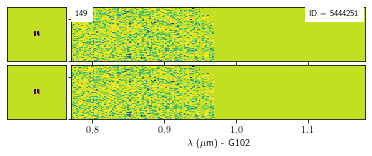

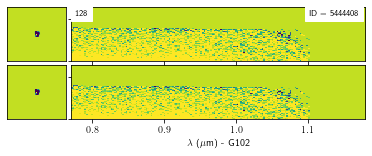

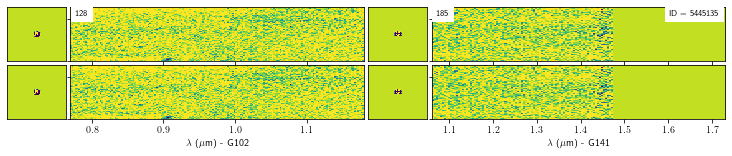

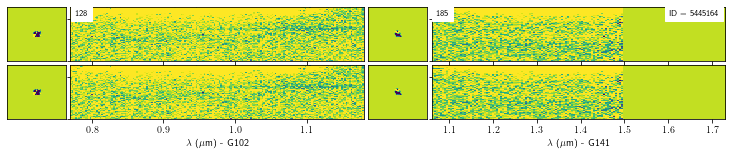

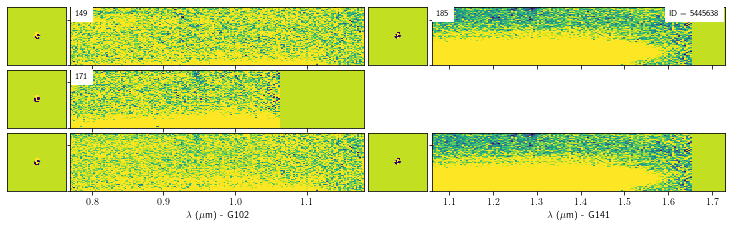

...

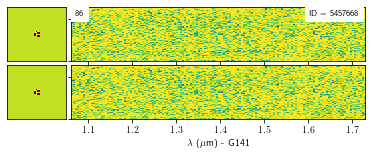

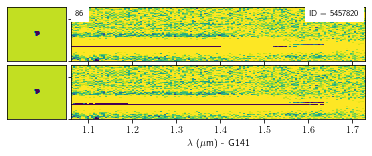

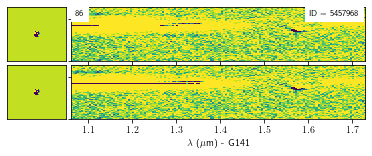

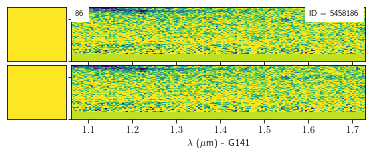

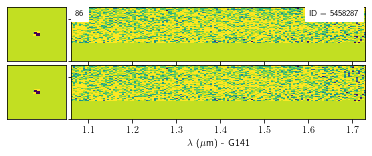

In [24]:
for id in dis_unmatched['ID_Finkelstein']:
    if os.path.isfile(field + '_' + '%.5i.beams.fits'%id):

        mb = grizli.multifit.MultiBeam(field + '_' + '%.5i.beams.fits'%id, fcontam=fcontam, group_name=field)
        wave = np.linspace(2000,2.5e4,100)

        print ('creating poly_templates...')
        poly_templates = grizli.utils.polynomial_templates(wave=wave, order=7,line=False)
        pfit = mb.template_at_z(z=0, templates=poly_templates, fit_background=True, fitter='lstsq', fwhm=1400, get_uncertainties=2)
        print ('drizzle_grisms_and_PAs...')

        hdu, fig = mb.drizzle_grisms_and_PAs(size=32, fcontam=fcontam, flambda=False, scale=1, 
                                            pixfrac=0.5, kernel='point', make_figure=True, usewcs=False, 
                                            zfit=pfit,diff=True)
        # Save drizzled ("stacked") 2D trace as PNG and FITS
        fig.savefig('{0}_{1:05d}.stack.png'.format(field, id))
        hdu.writeto('{0}_{1:05d}.stack.fits'.format(field, id), clobber=True)
        phot = None
        '''
        out = grizli.fitting.run_all(
            id, 
            t0=templ0, 
            t1=templ1, 
            fwhm=1200, 
            zr=[5., 12.0],              #zr=[0.0, 12.0],    #suggests zr = [0, 12.0] if we want to extend redshift fit
            dz=[0.004, 0.0005], 
            fitter='nnls',
            group_name=field,# + '_%i'%phot_scale_order,
            fit_stacks=False,          #suggests fit_stacks = False, fit to FLT files
            prior=None, 
            fcontam=fcontam,           #suggests fcontam = 0.2
            pline=pline, 
            mask_sn_limit=np.inf,      #suggests mask_sn_limit = np.inf
            fit_only_beams=True,       #suggests fit_only_beams = True
            fit_beams=False,           #suggests fit_beams = False
            root=field,
            fit_trace_shift=False,  
            bad_pa_threshold = np.inf, #suggests bad_pa_threshold = np.inf
            phot=phot, 
            verbose=True, 
            scale_photometry=0, 
            show_beams=True,
            use_psf = True)          #default: False
        '''

In [89]:
xcat

673.7476810178235